Basic setups

If we are using an older version of the pacakge, we are not able to run pbdb_occurences
So we have to download the API from the github with the most updated information.

In [1]:
#install.packages("paleobioDB")
library(devtools)
install_github('ropensci/paleobioDB')
library(paleobioDB)

from URL https://api.github.com/repos/ropensci/paleobioDB/zipball/master
Installing paleobioDB
'/Library/Frameworks/R.framework/Resources/bin/R' --no-site-file --no-environ  \
  --no-save --no-restore --quiet CMD INSTALL  \
  '/private/var/folders/c3/bzm4vh_91zdbl5wz5zt4wn200000gn/T/RtmpuuJcEz/devtools59a3410bb06d/ropensci-paleobioDB-f731aa6'  \
  --library='/Library/Frameworks/R.framework/Versions/3.4/Resources/library'  \
  --install-tests 

Loading required package: raster
Loading required package: sp
Loading required package: maps


# Introduction

We are doing basic set up and exlopre with the PBDB data frame in this notebook. At the end, we will perform a visualization based on chronological orderings so that we are able to see two interesting immigration/evoluation patterns.

Find the information of a specific collection record with an id.
It is also an example about getting familiar with the package.

In [2]:
pbdb_collection (id=1003, vocab="pbdb", show="loc")

collection_no,record_type,formation,lng,lat,llp,collection_name,n_occs,early_interval,reference_no,cc,state,county
1003,collection,Cherokee Shale,-94.80417,37.33111,MS,"USGS 7848-Cherokee Co., Kansas",1,Desmoinesian,33,US,Kansas,Cherokee


In [3]:
a<-pbdb_collection (id=1003, vocab="pbdb", show=c('loc'))

Put the dataframe in a global map

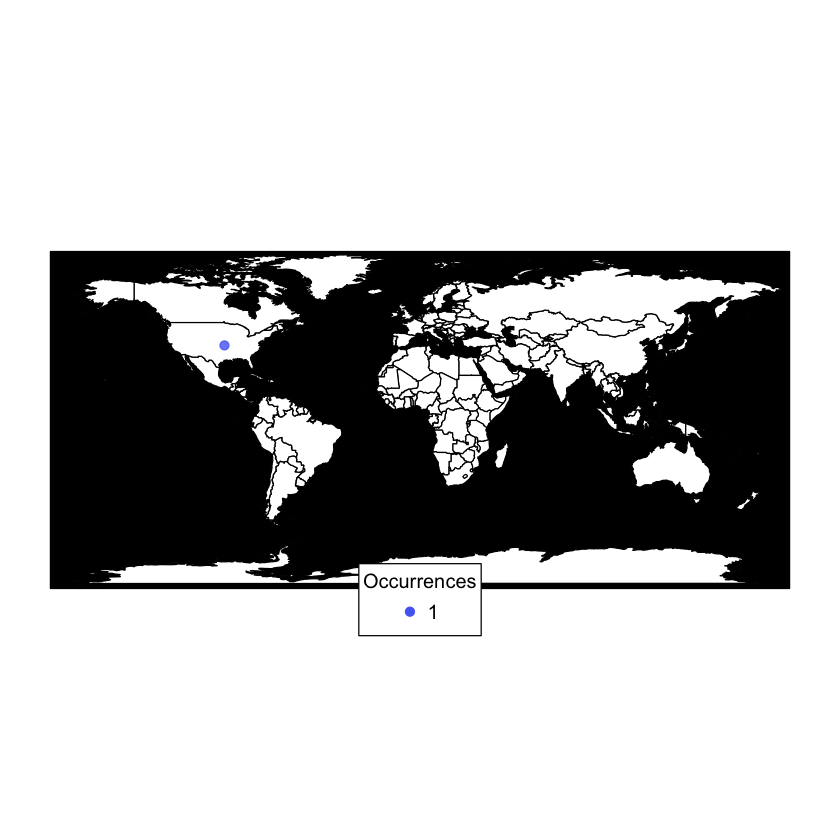

In [4]:
pbdb_map (a)

x is all the dinasour class or family

try and catch needs to be applied here. This is the link source of these names: https://en.wikipedia.org/wiki/Dinosaur_classification

In [5]:
x <- list('Abelisauridae', 'Noasauridae', 'Megalosauridae','Spinosauridae','Allosauridae',
           'Carcharodontosauridae','Neovenatoridae','Metriacanthosauridae','Coeluridae','Tyrannosauridae',
         'Ornithomimidae','Alvarezsauridae','Therizinosauridae','Troodontidae','Dromaeosauridae',
          'Aves','Thecodontosaurus','Plateosauridae','Riojasaurus','Massospondylidae',
          'Vulcanodontidae','Omeisauridae','Cetiosauridae','Diplodocidae','Camarasauridae',
          'Brachiosauridae','Euhelopodidae','Titanosauridae','Pisanosauridae','Fabrosauridae',
          'Scelidosauridae','Stegosauria','Nodosauridae','Ankylosauridae','Pachycephalosauria',
          'Psittacosauridae','Protoceratopsidae','Ceratopsidae','Heterodontosauridae','Hypsilophodontidae',
          'Iguanodontidae','Hadrosauridae'
         )


In the cell below, we are running the function that visualizes every species(so called) by pointing their occurences on the global map. A lot of run time required. Used try and catch because some species have little data and none value errors occured. Here try and catch is uesed to ignore errors and keep the loops running because the error is from lack of data so this error is trivial here. In other situations, try and catch is used to catch the possible exceptions so we are able to know the error and then debug.  This link is from CS61A and it is a brief introduction about the try and catch statement. 
https://www.ocf.berkeley.edu/~shidi/cs61a/wiki/Exception

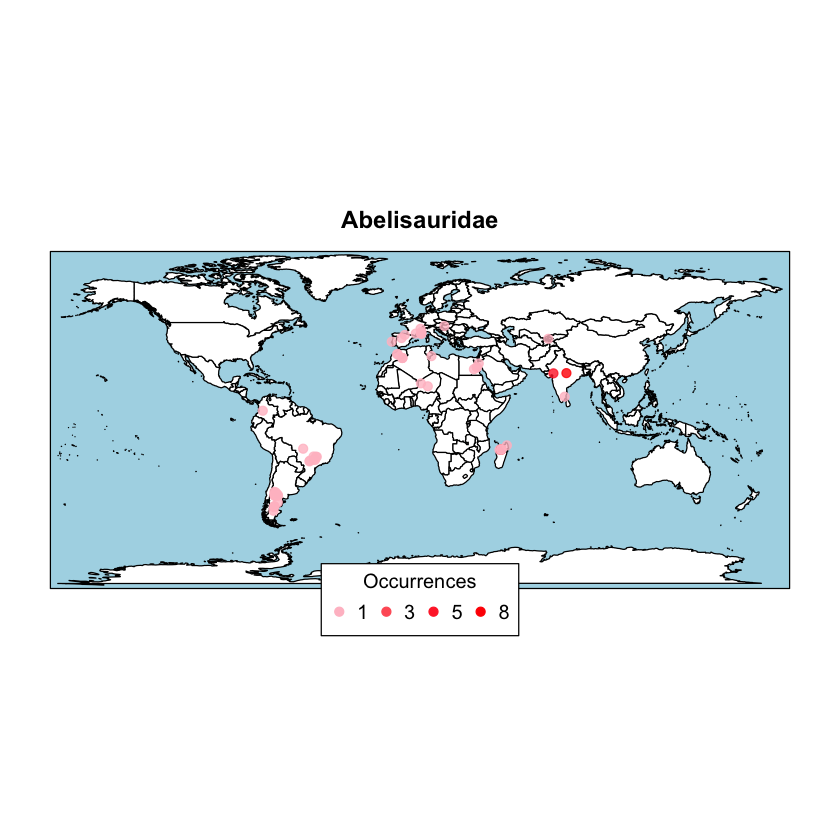

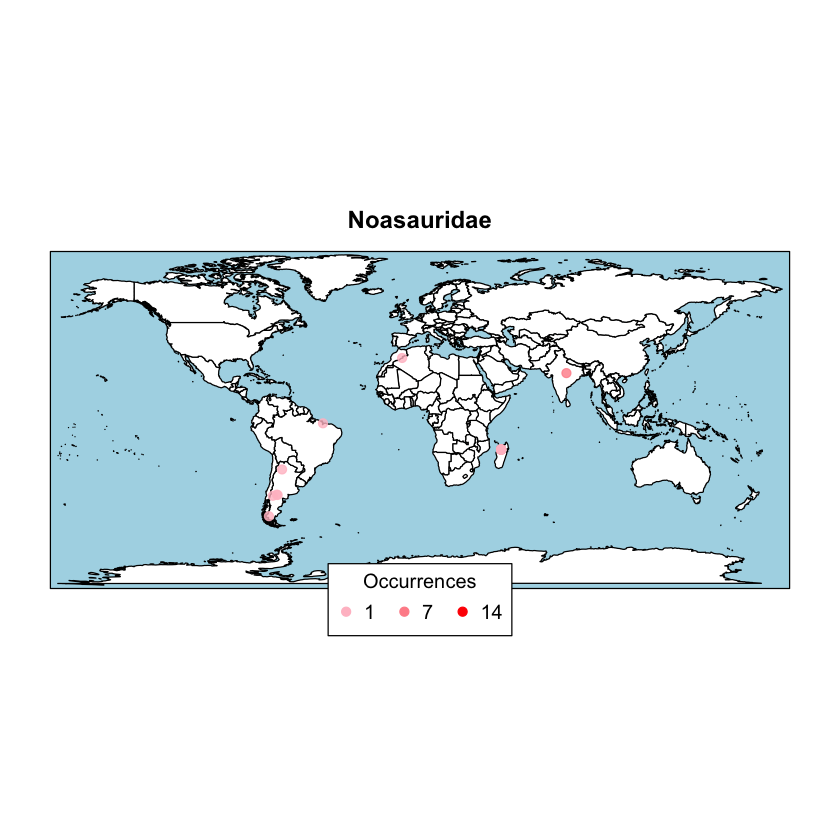

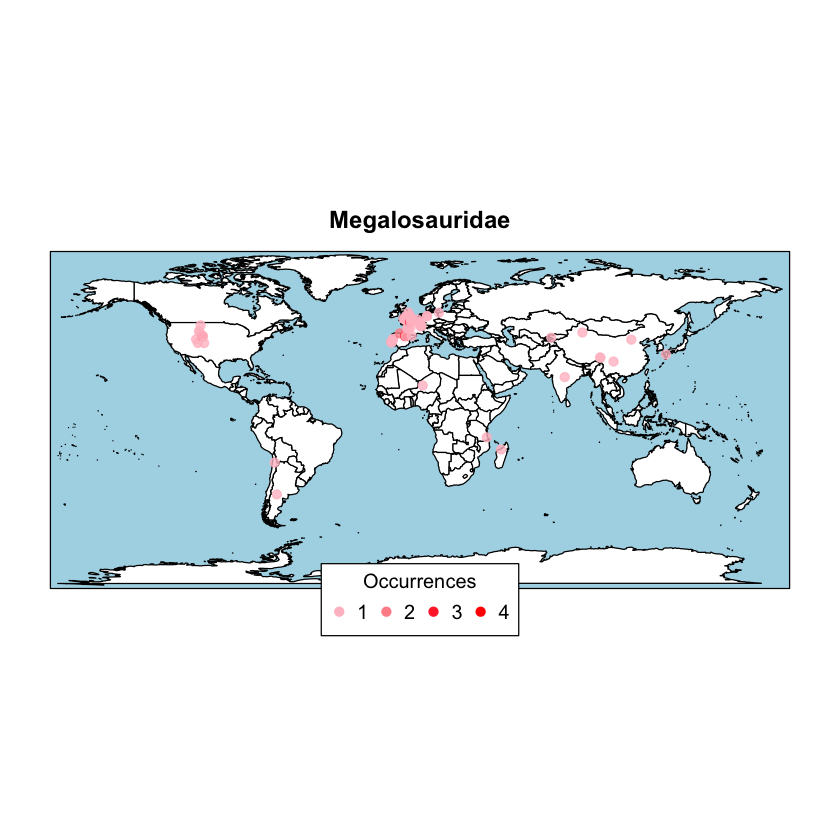

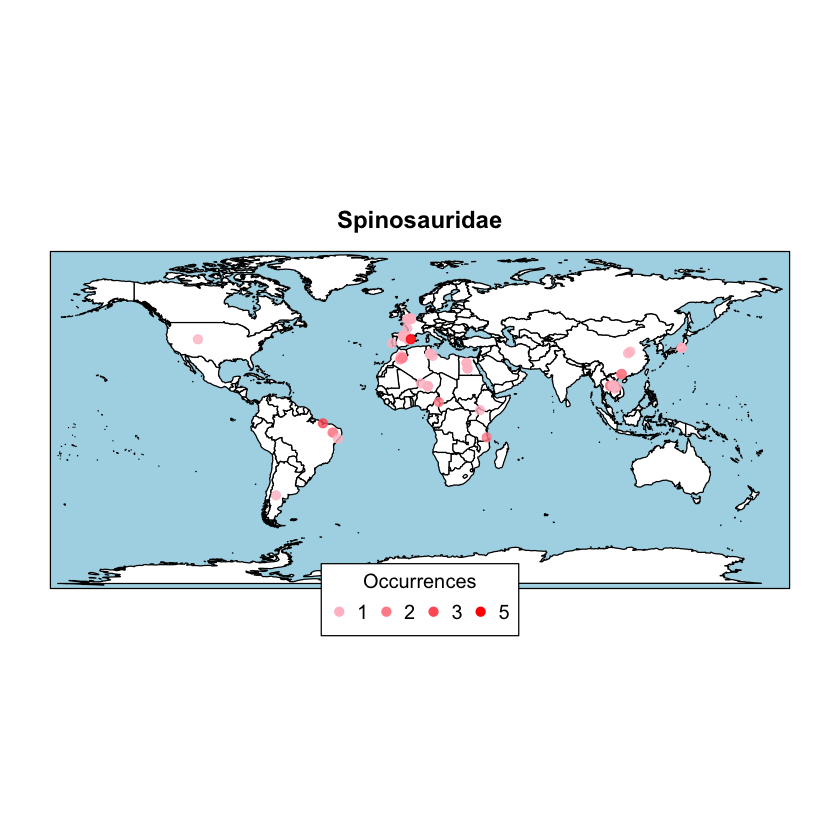

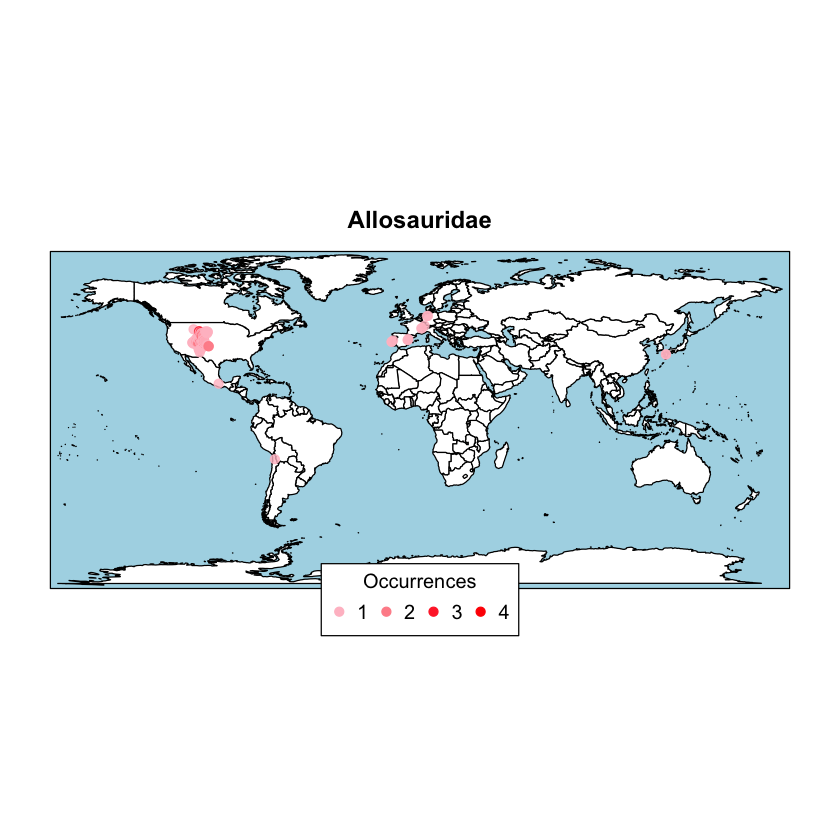

...

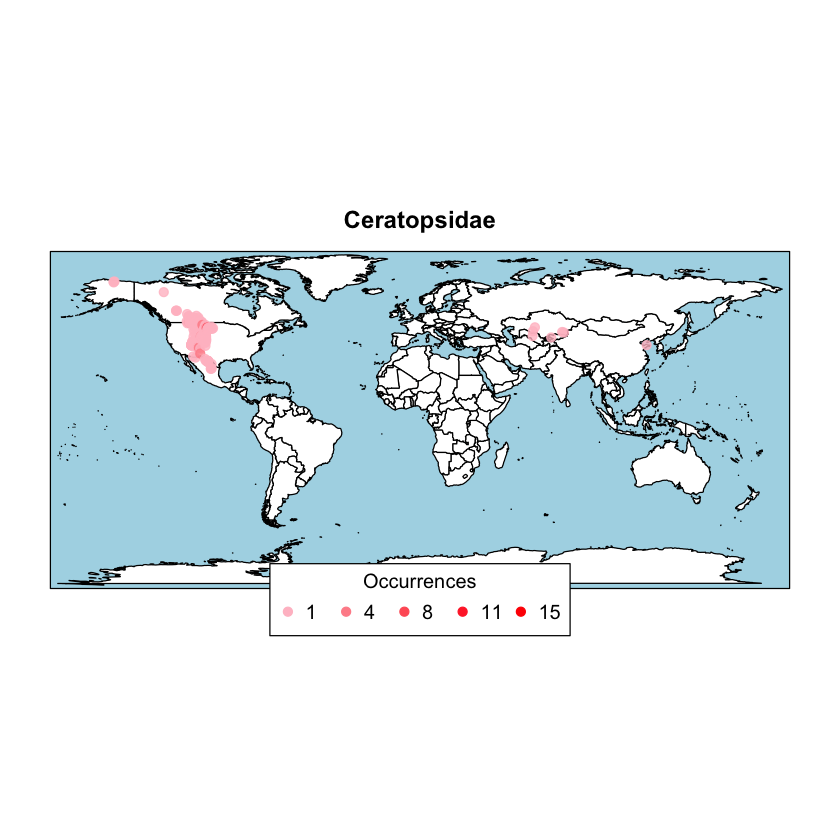

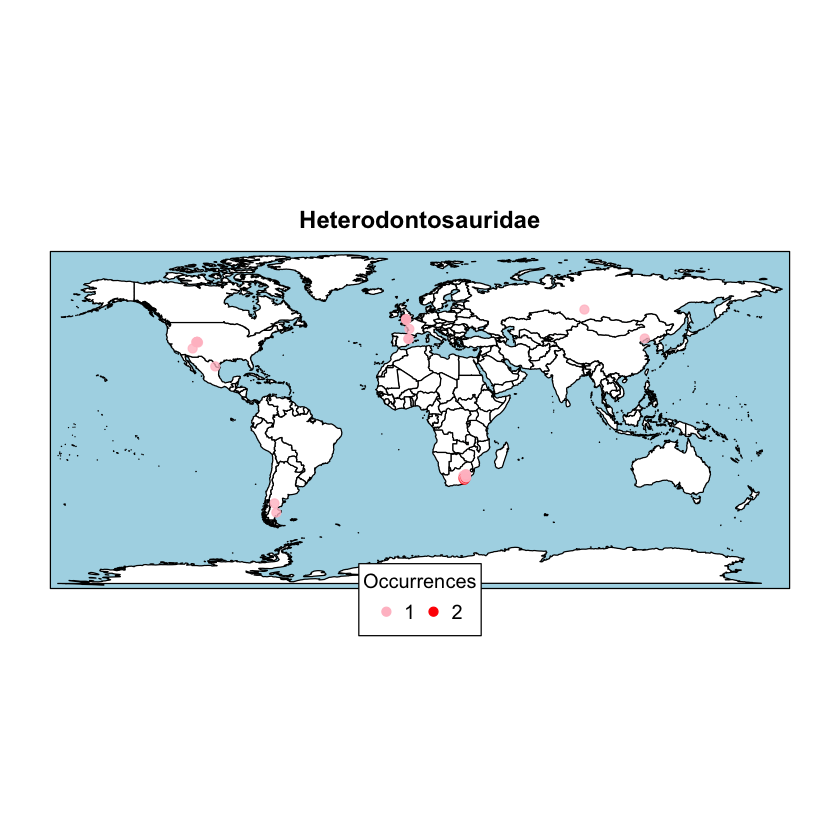

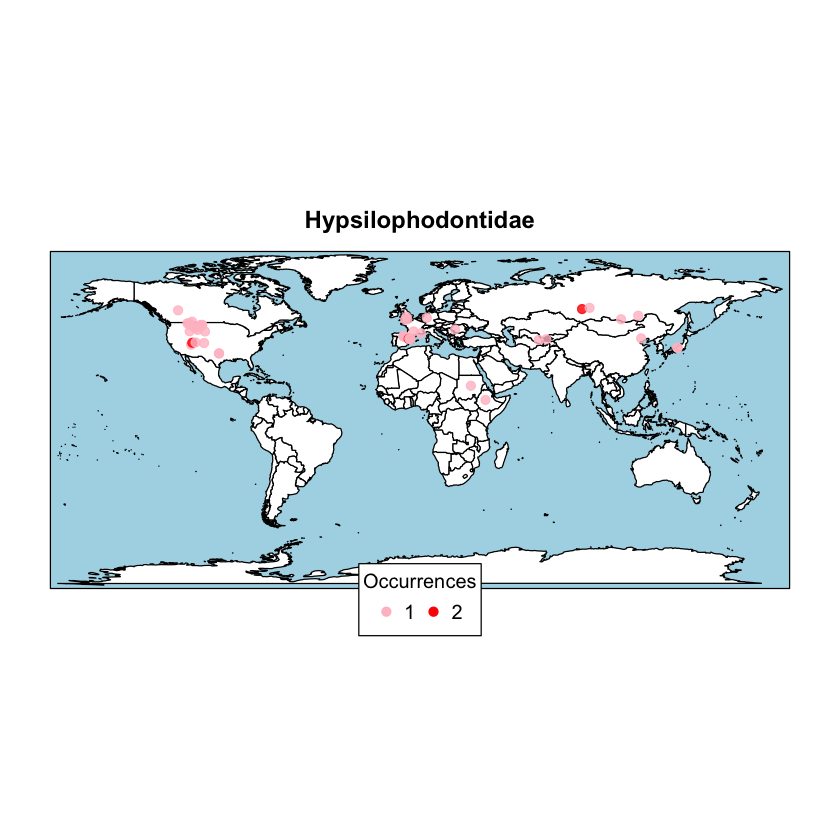

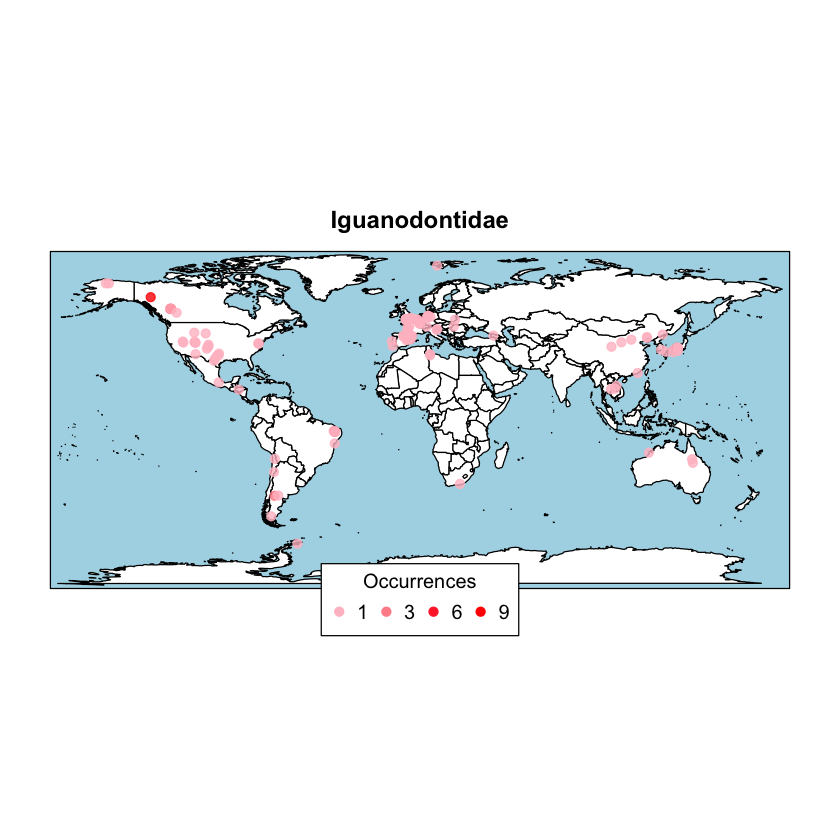

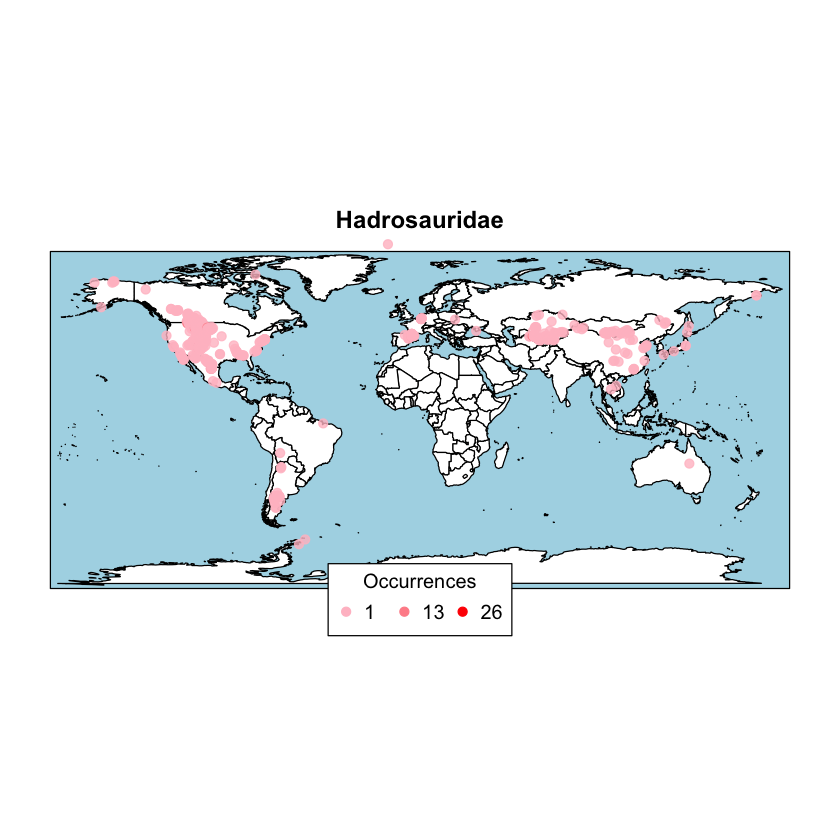

In [6]:
for(i in x){tryCatch(pbdb_map(
    pbdb_occurrences(limit="all",base_name=i, vocab="pbdb",show=c("coords", "phylo", "ident")),
    col.point=c("pink","red"), col.ocean="light blue",main = i),error=function(e){})}


Then call the pbdb_occurrences with the base_name as x so that we can get all the Dinasours occurence data under one variable name as try.

In [7]:
try <- pbdb_occurrences(limit="all",base_name=x, vocab="pbdb",show=c("coords", "phylo", "ident"))

Store the dinasour occurences data locally in a csv form.

In [8]:
write.csv(try, '../data/output/dinasourdata.csv')

According to our try and the visualiztions before, I decide to choose Dromaeosauridae and Tyrannosauridae because they are widely spread and have similar patterns from the North America to Russia and Mongolia. 

Dromaeosauridae is a family of feathered theropod dinosaurs. Wikipedia link https://en.wikipedia.org/wiki/Dromaeosauridae and one introduction from Berkeley http://www.ucmp.berkeley.edu/diapsids/saurischia/dromaeosauridae.html.

![image](../image/velociraptor1_skrep.jpg)

Image from http://www.ucmp.berkeley.edu/diapsids/saurischia/dromaeosauridae.html

Tyrannosauridae (or tyrannosaurids, meaning "tyrant lizards") is a family of coelurosaurian theropod dinosaurs that comprises two subfamilies containing up to thirteen genera, including the eponymous Tyrannosaurus. WikiPedia Link https://en.wikipedia.org/wiki/Tyrannosauridae Also an introduction note from UCBerkeley http://www.ucmp.berkeley.edu/diapsids/saurischia/tyrannosauridae.html
![image](../image/rex_fullview.jpg)
Image from http://www.ucmp.berkeley.edu/diapsids/saurischia/tyrannosauridae.html

For convience, get those two types' occurences from PBDB and save them locally.

In [9]:
Dromaeosauridae = pbdb_occurrences(
    limit="all",base_name='Dromaeosauridae', vocab="pbdb",show=c("coords", "phylo", "ident"))
Tyrannosauridae = pbdb_occurrences(
    limit="all",base_name='Tyrannosauridae', vocab="pbdb",show=c("coords", "phylo", "ident"))

write.csv(Dromaeosauridae, '../data/output/Dromaeosauridae.csv')

write.csv(Tyrannosauridae, '../data/output/Tyrannosauridae.csv')

Visualzie the Dromaeosauridae's occurence data.

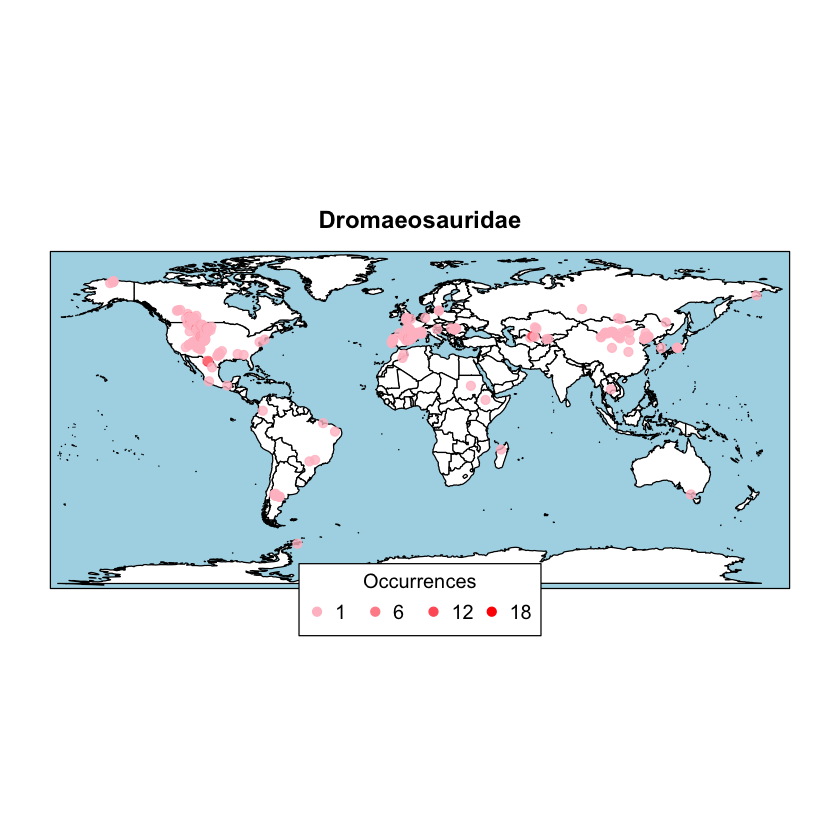

In [10]:
pbdb_map(Dromaeosauridae,col.point=c("pink","red"), col.ocean="light blue", main='Dromaeosauridae')

Visualzie the Tyrannosauridae's occurence data.

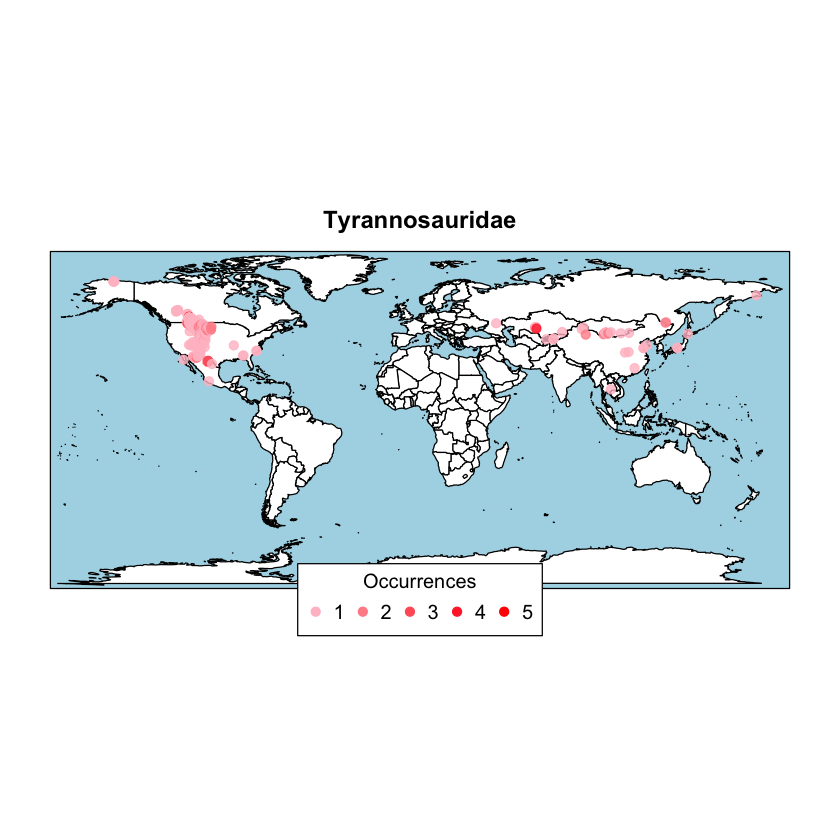

In [11]:
pbdb_map(Tyrannosauridae,col.point=c("pink","red"), col.ocean="light blue", main='Tyrannosauridae')

After doing this data retrieving, we are going to python notebook and pbdb site to find out their occurence timeline so the migration routine can be known. 

This is an interesting intereactive earth and its continent changes druing geological time. https://www.smithsonianmag.com/science-nature/travel-through-deep-time-interactive-earth-180952886/
![image](../image/earth.jpg)
This is how earth looks like during Jurassic time, which is the closet time we can find when our two dinasour familes are most active.

![image](../image/136145-050-0AC28C9A.jpg)
This is how earth looks like in the late Jurrasic.

![image](../image/136144-050-200CA3A5.jpg)
This is how earth looks like in the Crtecaous.
These two images are from https://www.britannica.com/science/

![image](../image/D1.jpg)
![image](../image/D2.jpg)
On pbdb's website, we can find that Dromaeosauridae are originated in North America and South Europe during J. Then they are wide spread to Russia and Asia During C.

![image](../image/T1.jpg)
![image](../image/T2.jpg)
On pbdb's website, we can find that Tyrannosauridae are originated in North America and Middle Asia during late C. Then they are wide spread to Russia,Asia and America in later times.

I am going to use python to do some analysis about the time line of our two dinasour specieces and further researches.

When we reach here, we need to go to the python notebook to generate the time based categoried species.

After running the python notebook, now we have a lot of categorized data files.We are gonna visualize them using pdbd_map

Lets get back to our visualization. We use r read the data frames first; then we are able to do some interesting stuff with a lot of graphs.

In [12]:
# read the data
Tyrannosauridae_timed <- read.csv('../data/output/Tyrannosauridae.csv', header = TRUE, sep = ",", quote = "\"",
         dec = ".", fill = TRUE, comment.char = "")
Dromaeosauridae_timed <- read.csv('../data/output/Dromaeosauridae.csv', header = TRUE, sep = ",", quote = "\"",
         dec = ".", fill = TRUE, comment.char = "")

The list of all late intervals
PS: The smaller the numbers are, the closer to our current age. So the later the species apperas.

In [13]:
early_age_of_Tyrannosauridae <-unique(sort(Tyrannosauridae_timed$early_age, decreasing = TRUE))
early_age_of_Dromaeosauridae <-unique(sort(Dromaeosauridae_timed$early_age, decreasing = TRUE))

Install a package to use filter which is a very function for analyzing
This is a link which introduces this package https://uc-r.github.io/dplyr

In [14]:
install.packages("dplyr")
library(dplyr)



The downloaded binary packages are in
	/var/folders/c3/bzm4vh_91zdbl5wz5zt4wn200000gn/T//RtmpuuJcEz/downloaded_packages



Attaching package: ‘dplyr’

The following objects are masked from ‘package:raster’:

    intersect, select, union

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



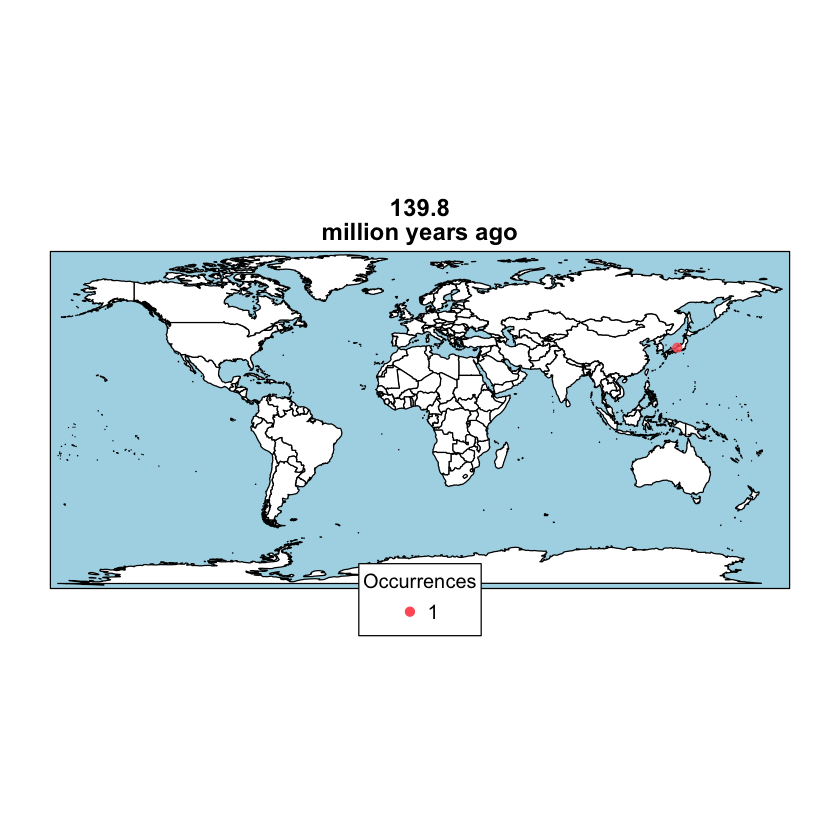

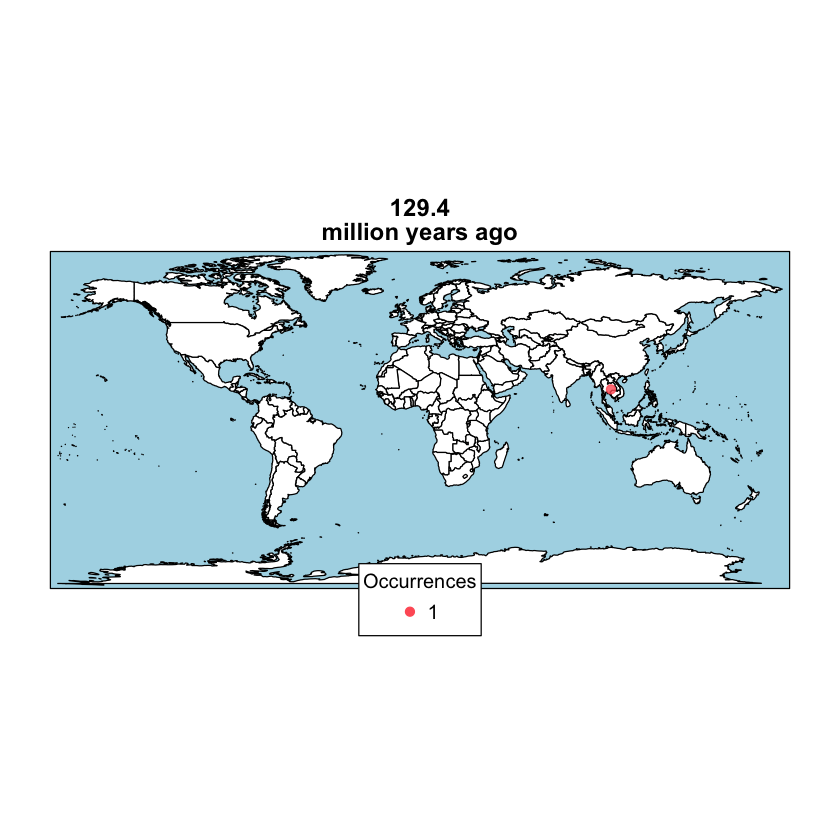

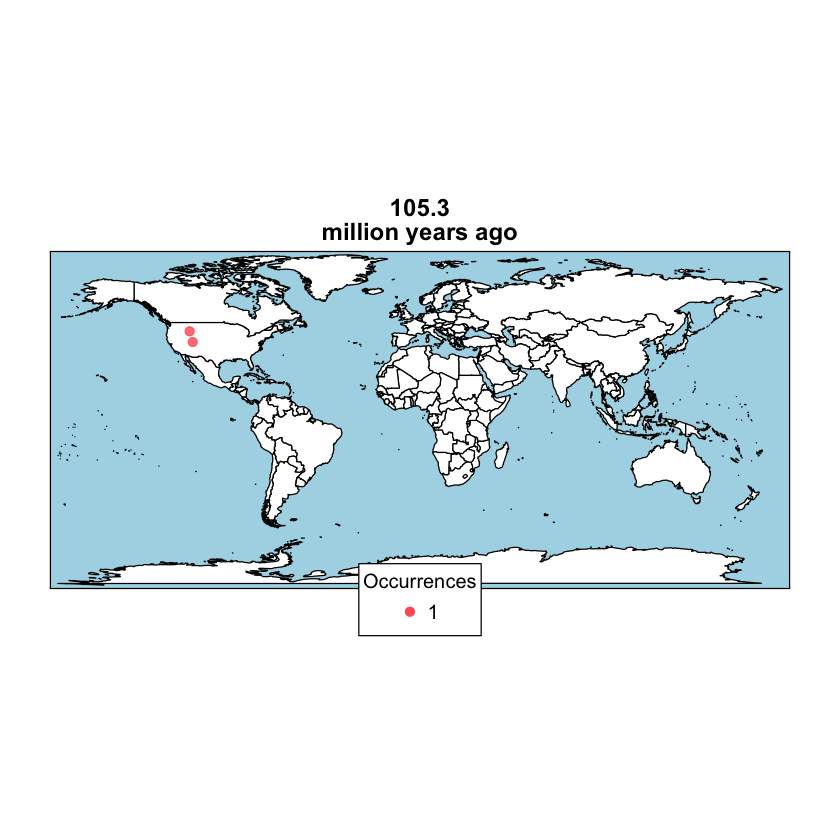

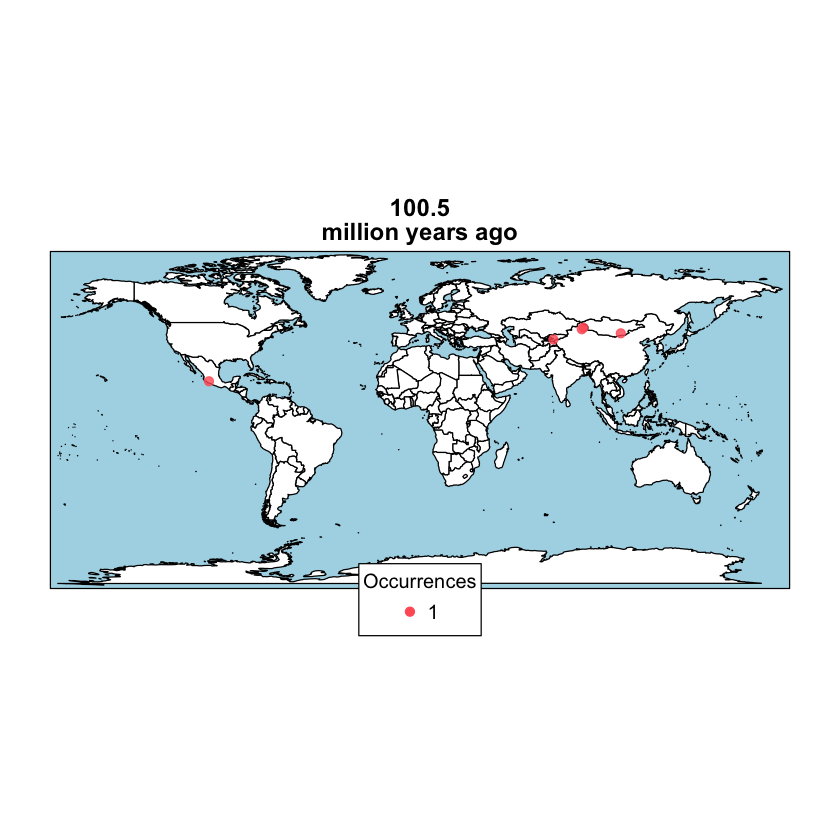

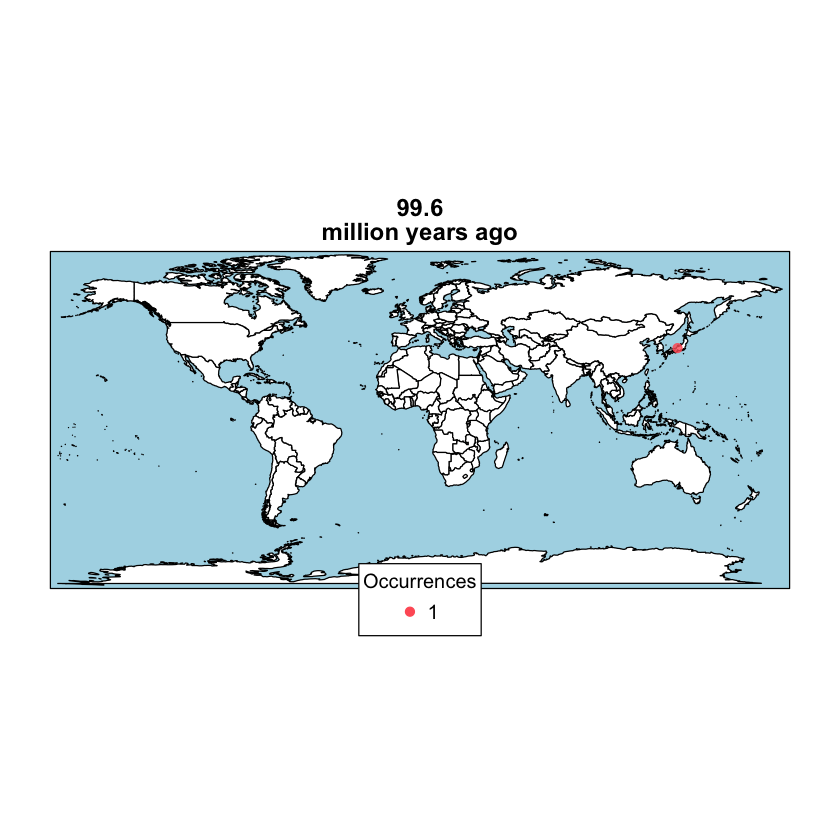

...

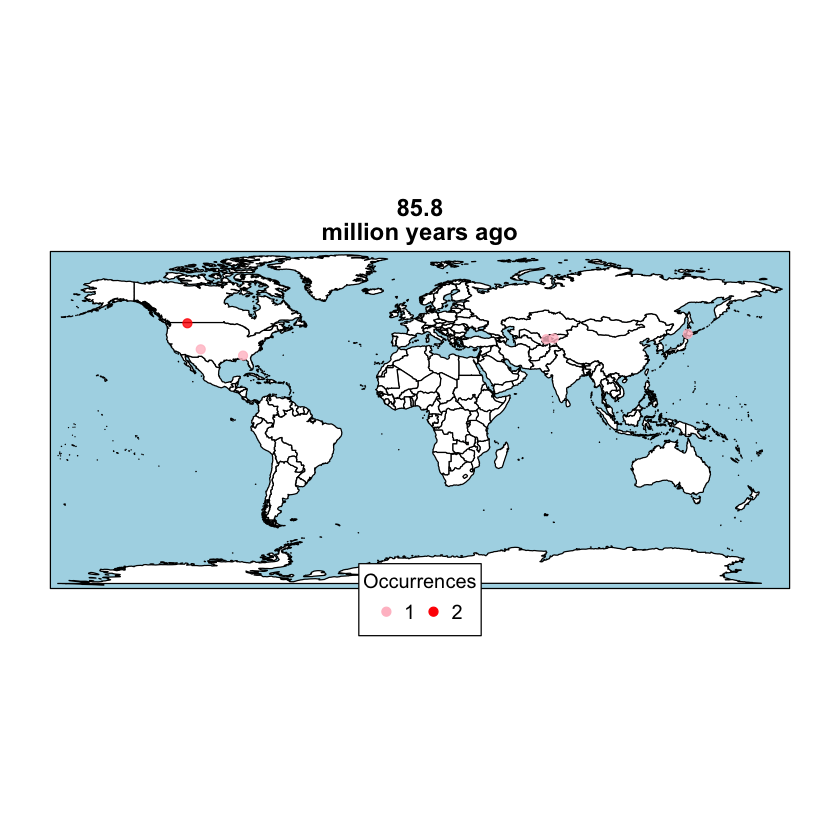

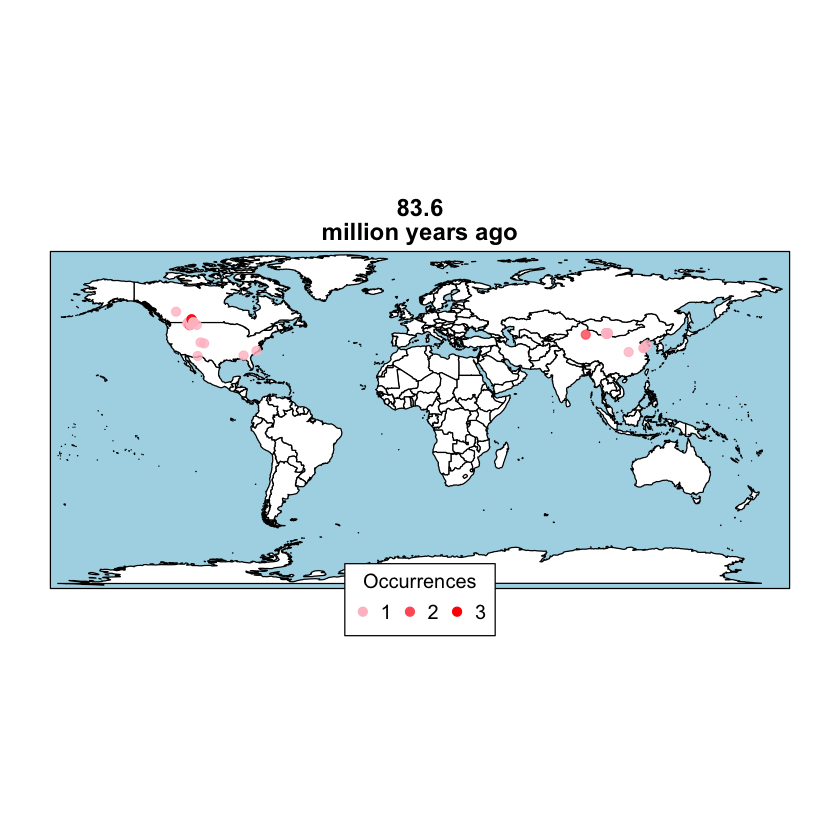

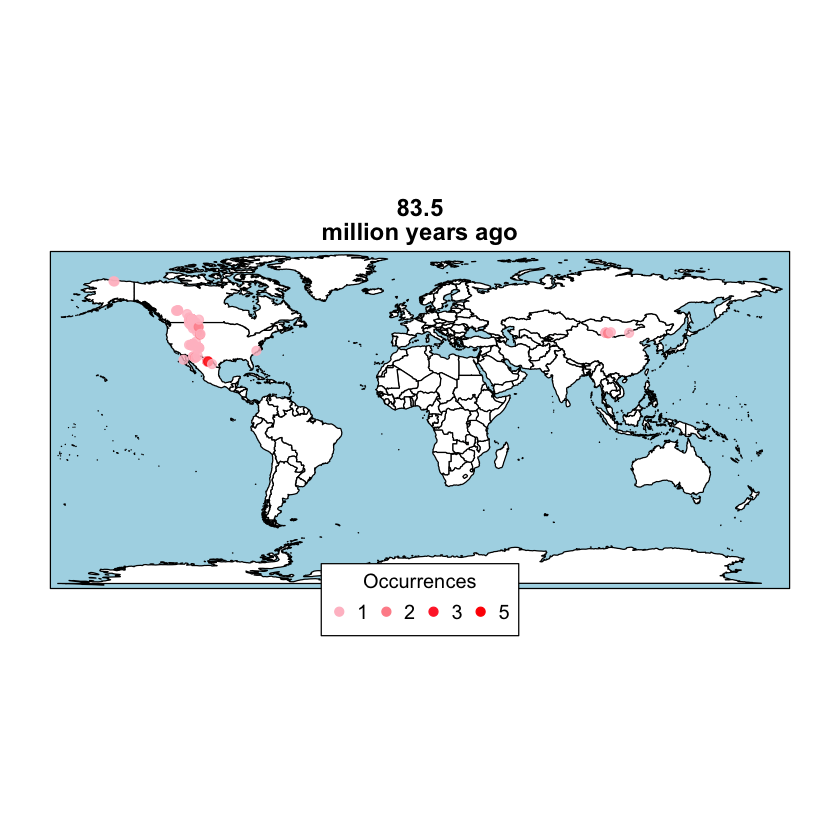

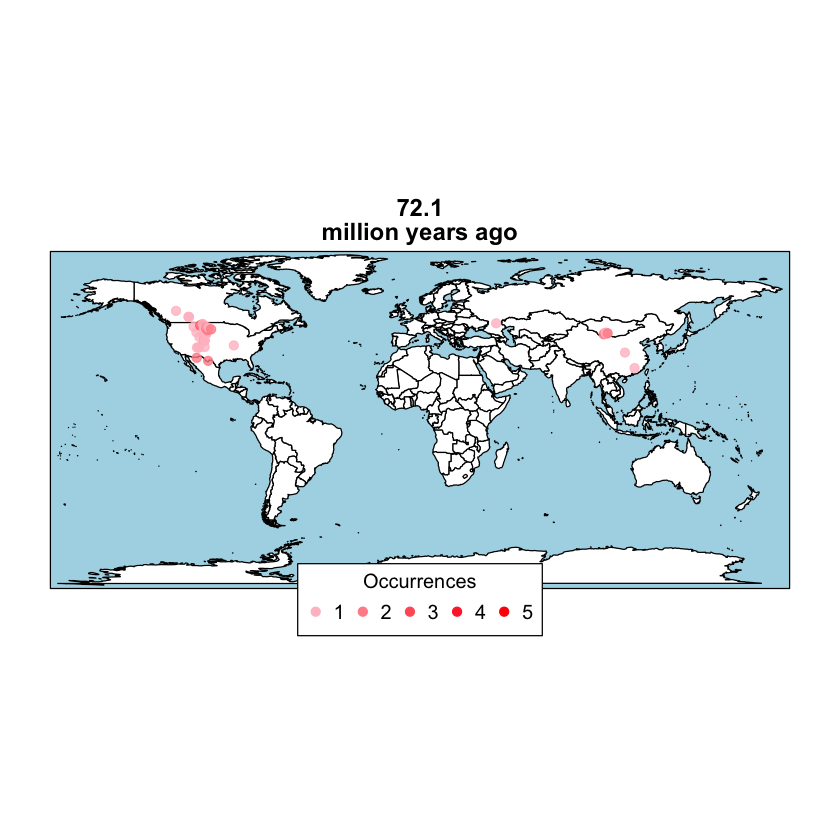

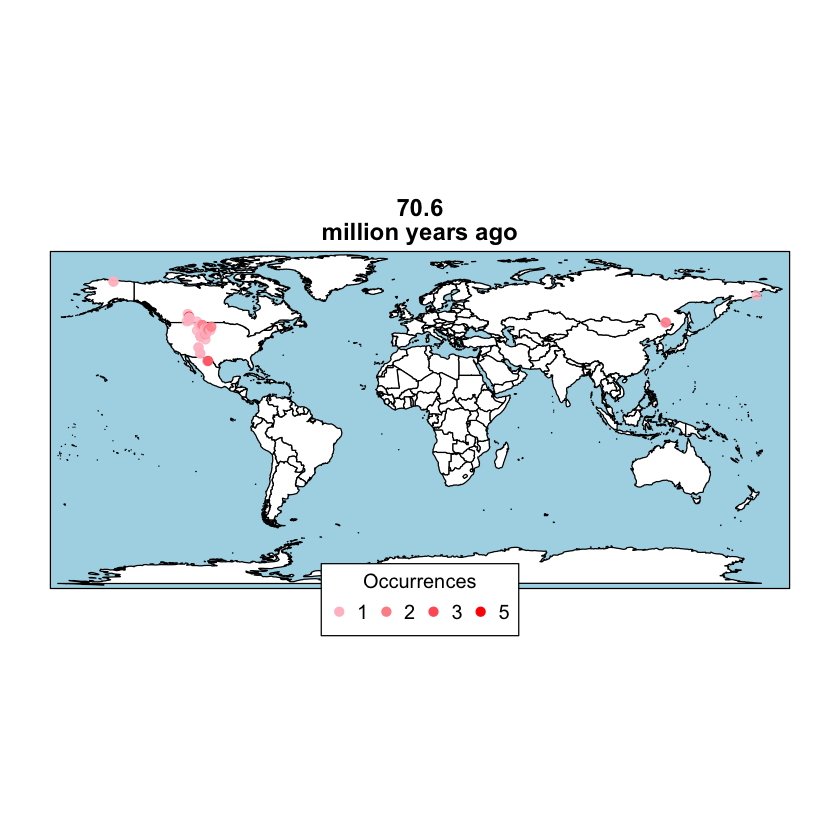

In [22]:
for (i in early_age_of_Tyrannosauridae){ 
pbdb_map(
    pbdb_occurrences(limit="all",id=filter(Tyrannosauridae_timed, early_age == i)[,2], vocab="pbdb",show=c("coords", "phylo", "ident")),
    col.point=c("pink","red"), col.ocean="light blue", main= c(i,'million years ago'))}

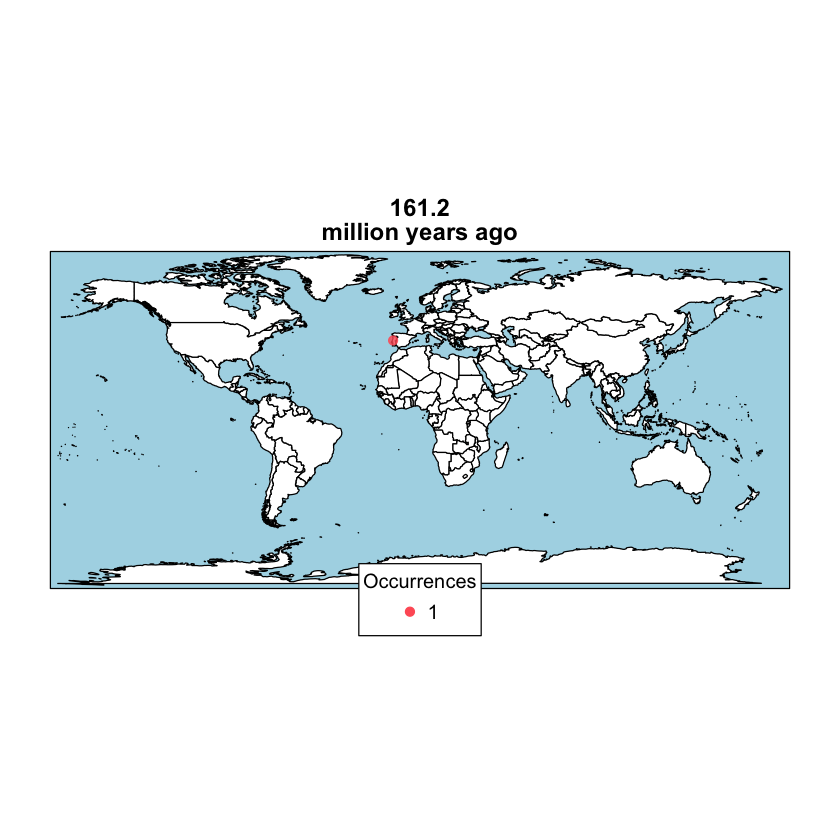

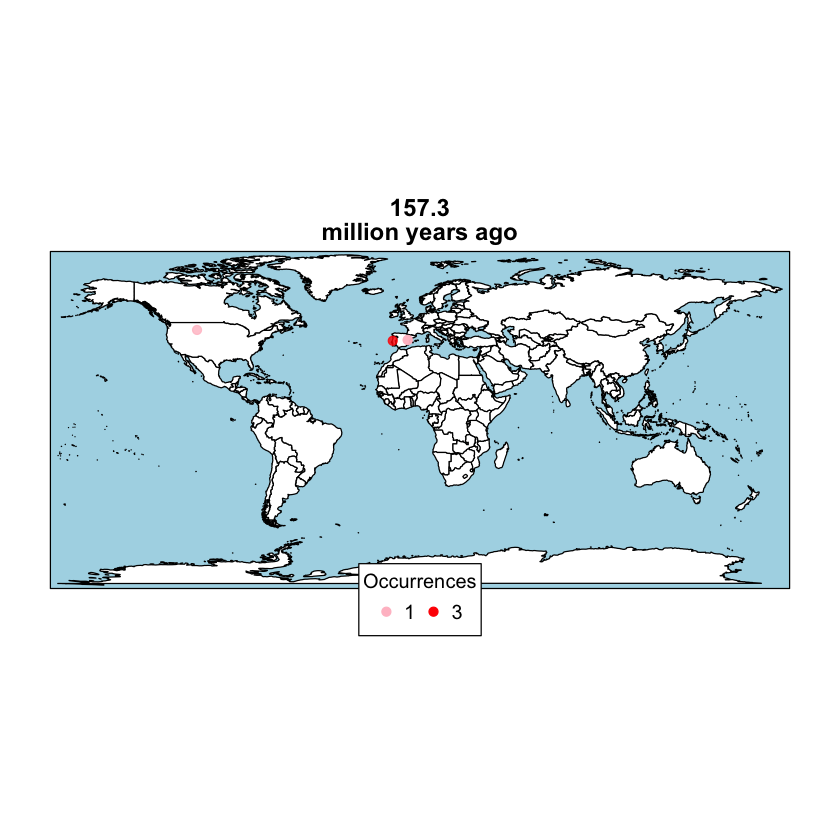

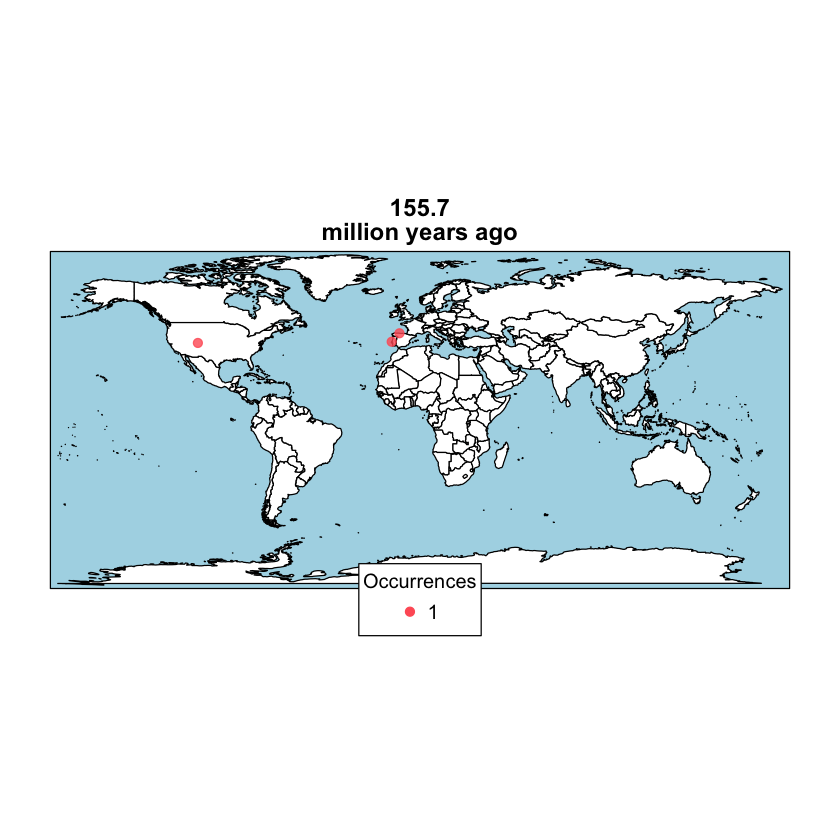

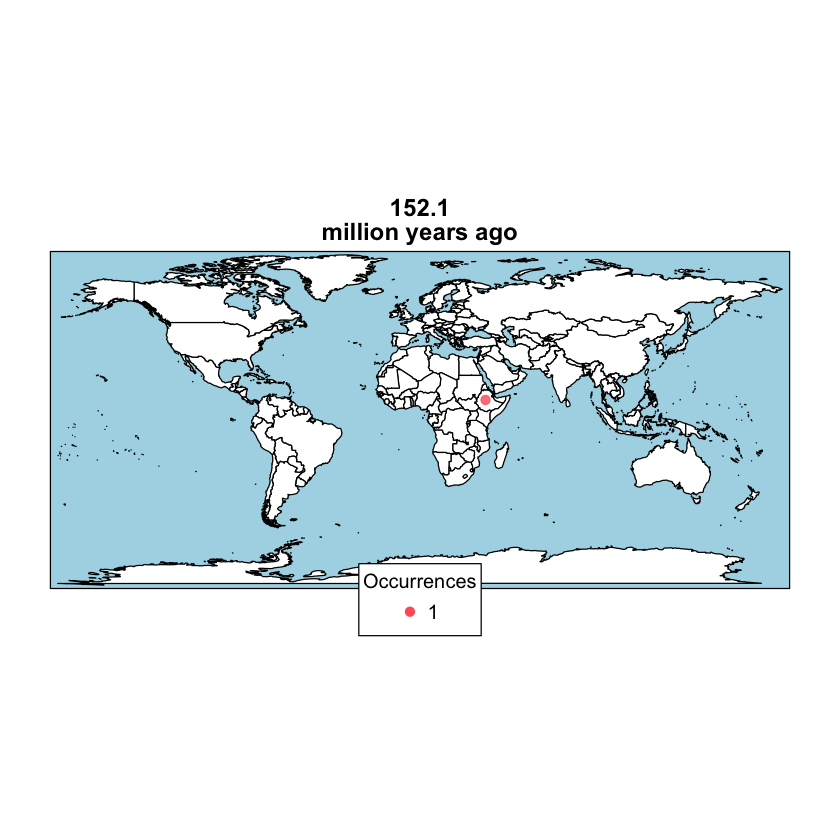

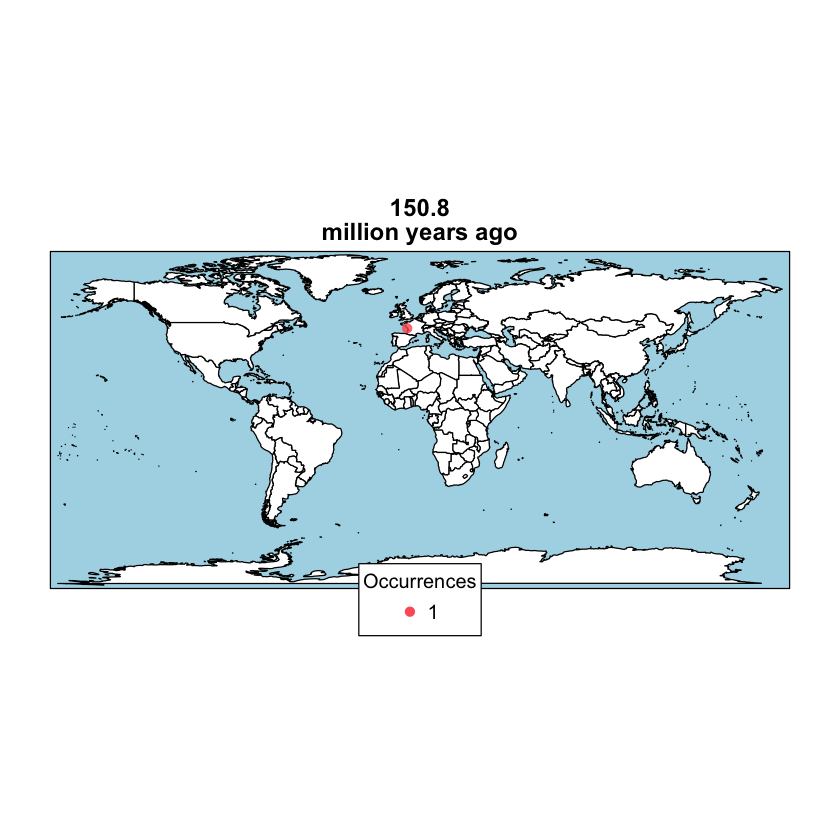

...

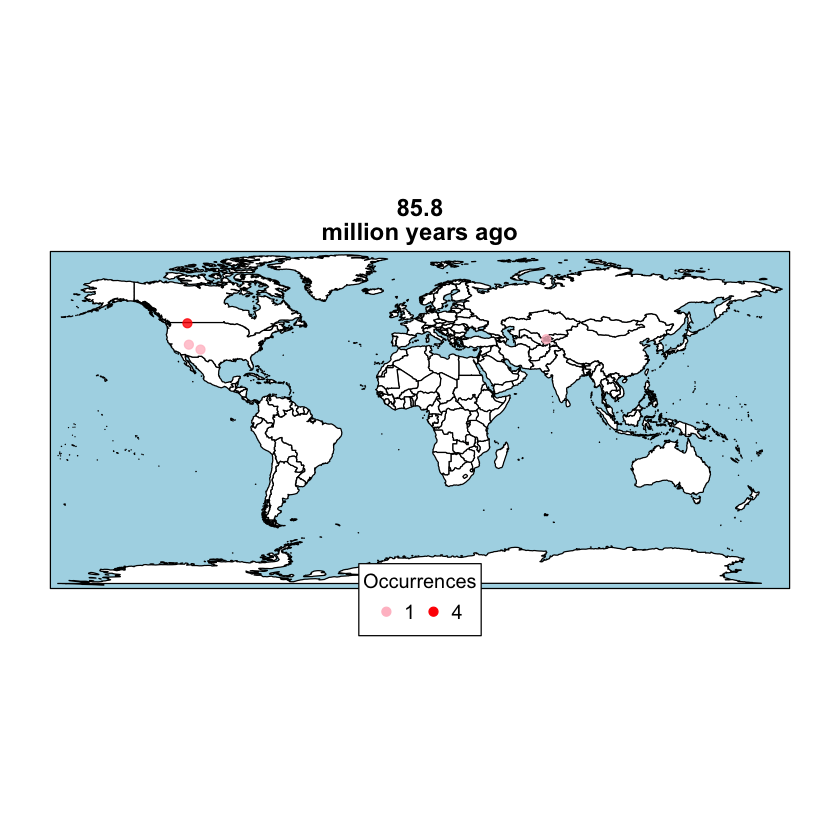

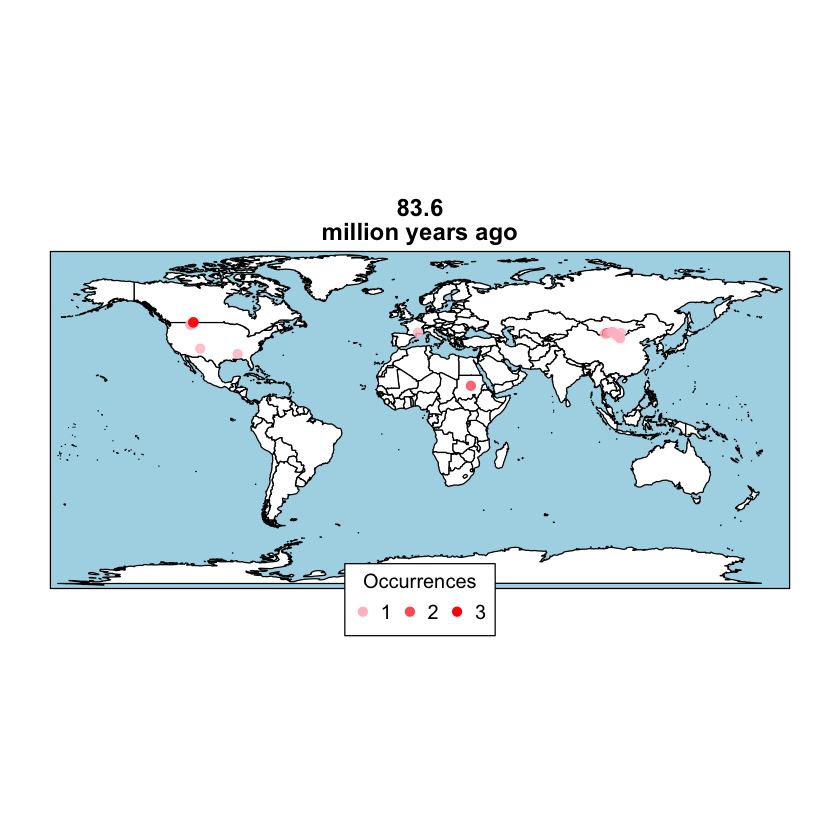

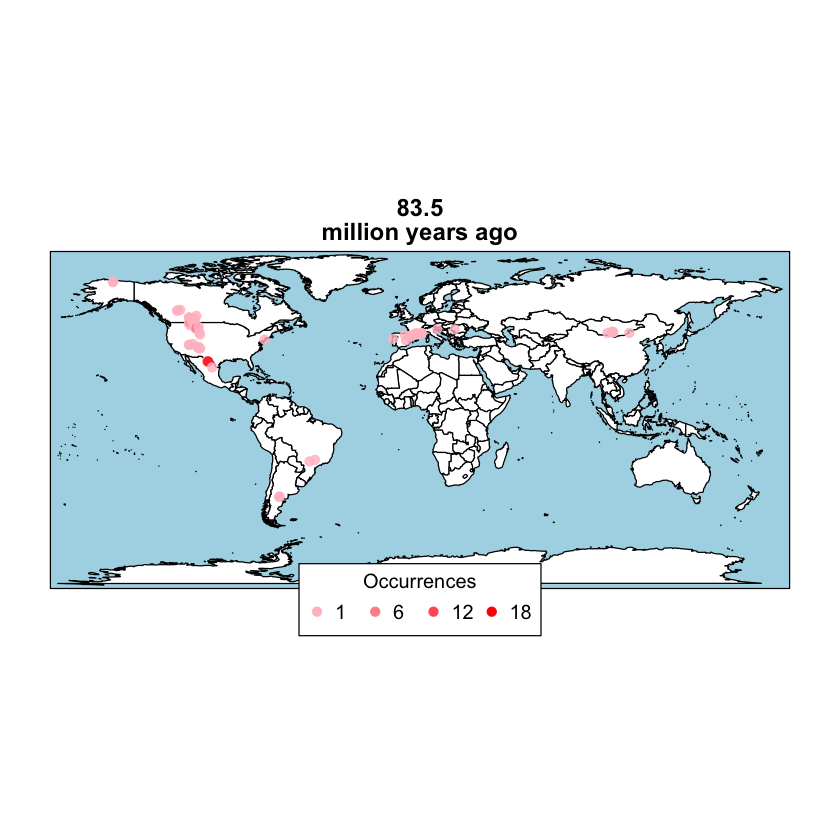

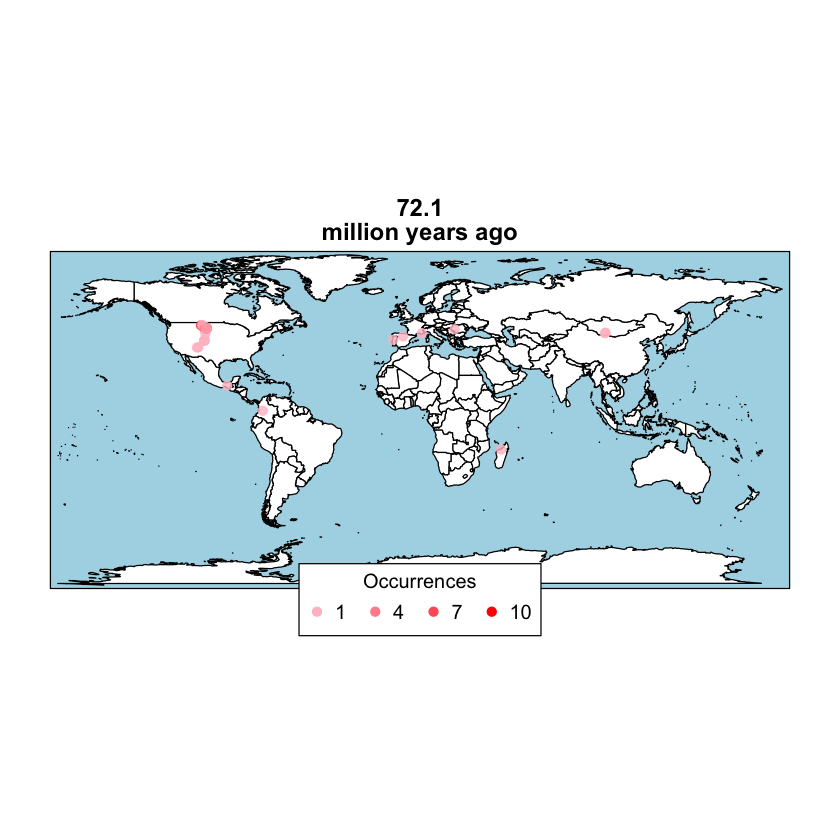

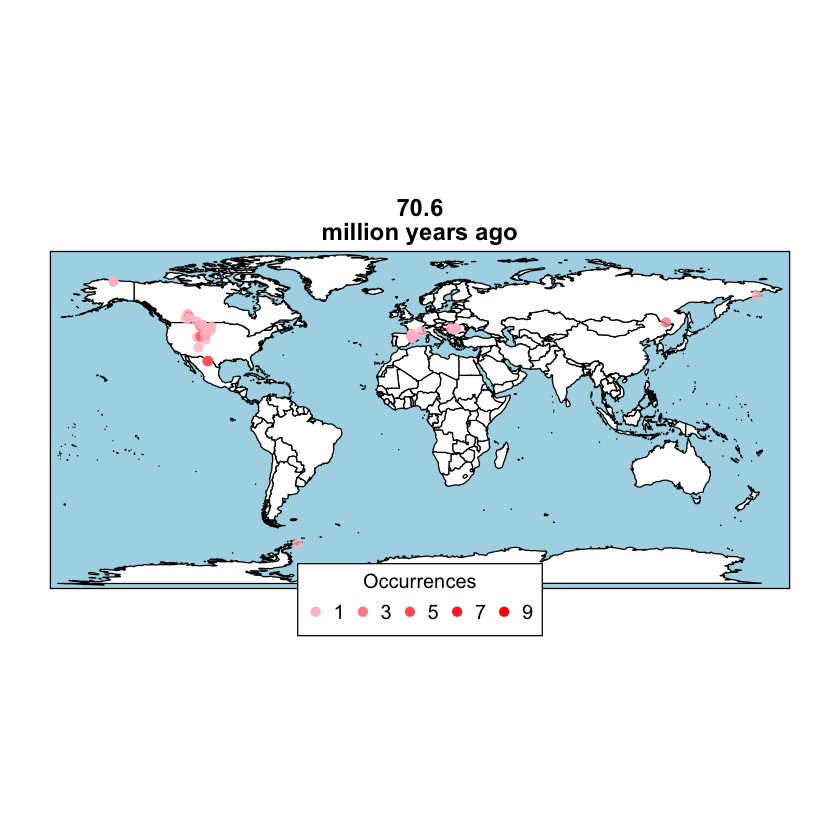

In [23]:
for (i in early_age_of_Dromaeosauridae){ 
pbdb_map(
    pbdb_occurrences(limit="all",id=filter(Dromaeosauridae_timed, early_age == i)[,2], vocab="pbdb",show=c("coords", "phylo", "ident")),
    col.point=c("pink","red"), col.ocean="light blue", main= c(i,'million years ago'))}

This is the link which provides the link from early age to geological time period. https://en.wikipedia.org/wiki/Cenomanian

This is a great site which provides the visualization of geological transitions ovettime. 
http://portal.gplates.org/

# Conclusion

What to write...

See the done meaning we are done with running all the cells and no errors occured. Congratulations on me!

In [17]:
print('Done!')

[1] "Done!"


This is a very exiciting project! The most important part I learned through this process is 